In [25]:
%run src/init.py basic

<span style='color:green'>**Configuration Ready (cse-in)**</span>

In [26]:
from src.init import CREATE, cseBaseName, Type

CREATE (                                                     # CREATE request
    
    # Create the AE resource under the CSEBase
    to                      = cseBaseName,  
    
    # Request Parameters
    originator              = 'Cmyself',                     # Assign an originator ID, must start with 'C'
    requestIdentifier       = '123',                         # Unique request identifier
    releaseVersionIndicator = '3',                           # Release version indicator
    resourceType            = Type.AE,                       # Type of the resource: AE
    
    # Request Body
    primitiveContent = 
        {   
            'm2m:ApplicationEntity': {
                'resourceName':             'TempSensor',   # Name of the resource 
                'App-ID':                   'NtempSensor',   # Application ID, must start with 'N'
                'requestReachability':      True,            # AE can receive requests
                'supportedReleaseVersions': [ '3' ]          # Supports oneM2M release 3
            }
        }
)

HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=2
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T180909,197633"
Content-Type,,application/json


---

In [27]:
CREATE (                                      # CREATE request
    
    # Create the container resource under the AE
    to                      = cseBaseName + '/TempSensor', 

    # Request Parameters
    originator              = 'Cmyself',      # Set the originator
    requestIdentifier       = '123',          # Unique request identifier
    releaseVersionIndicator = '3',            # Release version indicator
    resourceType            = Type.Container, # Type of the resource: container
    
    # Request Body
    primitiveContent = 
        {
            'm2m:Container': {
                'resourceName': 'Container'   # Set the resource name
            }
        },
)

HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=3
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T180918,063459"
Content-Type,,application/json


---

In [28]:
import random
def generate_simulated_data():
    return round(random.uniform(20,30)) 
    

In [29]:
import time


def send_data_onem2m_server(data):
    start_time = time.time()
    CREATE (                                            # CREATE request

    # Create the content instance resource under the container
    to                      = cseBaseName + '/TempSensor/Container', 

    # Request Parameters
    originator              = 'Cmyself',            # Set the originator
    requestIdentifier       = '123',                # Unique request identifier
    releaseVersionIndicator = '3',                  # Release version indicator
    resourceType            = Type.ContentInstance, # Type of the resource: contentInstance
    
    # Request Body
    primitiveContent = 
        {
            'm2m:ContentInstance': {
                'contentInfo': 'text/plain:0',      # Media type of the content
                'content': str(data)         # The content itself
            }
        }
    )
    end_time = time.time()
    rtt = (end_time - start_time)
    return rtt

    

In [30]:
import psutil


def measure_cpu_memory_usage():
    cpu_percent = psutil.cpu_percent()
    memory_percent = psutil.virtual_memory().percent
    return cpu_percent, memory_percent

In [34]:
import matplotlib.pyplot as plt
def simulate_sensor(sensor_id, iterations, start_delay=0):
    cpu_usage = []
    memory_usage = []
    sensor_rtts = []
    simulated_datas = []

    time.sleep(start_delay)

    for _ in range(iterations):
        simulated_data = generate_simulated_data()
        simulated_datas.append(simulated_data)
        rtt = send_data_onem2m_server(simulated_data)
        cpu_percent, memory_percent = measure_cpu_memory_usage()
        sensor_rtts.append(rtt)
        cpu_usage.append(cpu_percent)
        memory_usage.append(memory_percent)
        
    print(f"Sensor {sensor_id} datas: ",simulated_datas)
    print(f"Sensor {sensor_id} RTT values", sensor_rtts)
    print(f"Sensor {sensor_id} Maximum RTT:", max(sensor_rtts), "seconds")
    print(f"Sensor {sensor_id} Minimum RTT:",min(sensor_rtts), "seconds")
    print(f"Sensor {sensor_id} Mean RTT:", sum(sensor_rtts)/len(sensor_rtts), "seconds")
    print()
    plt.plot(sensor_rtts, label=f'Sensor {sensor_id}')
    plt.xlabel('Iteration')
    plt.ylabel('RTT(seconds)')
    plt.title('Round trip time (RTT) for sensors')
    plt.legend()
    plt.show()

def simulate_scenario1(num_sensors, iterations):
    threads = []
    for sensor_id in range(1, num_sensors+1):
        thread = threading.Thread(target=simulate_sensor, args=(sensor_id, iterations))
        threads.append(thread)
        thread.start()
    for thread in threads:
        thread.join()

def simulate_scenario2(num_sensors, iterations_per_sensor):
    threads = []
    start_delays = [0, 100, 200]  # Delays for starting each sensor
    for i in range(num_sensors):
        thread = threading.Thread(target=simulate_sensor, args=(i+1, iterations_per_sensor, start_delays[i]))
        threads.append(thread)
        thread.start()
    for thread in threads:
        thread.join()       

In [35]:
import threading


def simulate_multiple_sensors(num_sensors):
    
    threads = []
    cpu_usage = []
    memory_usage = []
    
    for sensor_id in range(1, num_sensors+1):
        thread = threading.Thread(target=simulate_sensor, args=(sensor_id,))
        threads.append(thread)
        thread.start()
        
    for thread in threads:
        thread.join()
        cpu_percent, memory_percent = measure_cpu_memory_usage()
        cpu_usage.append(cpu_percent)
        memory_usage.append(memory_percent)
    
    print(f"CPU usage", cpu_usage)
    print(f"Maximum cpu usage:", max(cpu_usage),"%")
    print(f"Minimum cpu usage:", min(cpu_usage),"%")
    print(f"Mean cpu usage:", sum(cpu_usage)/len(cpu_usage), "%")
        
    print(f"Memory usage", memory_usage)
    print(f"Maximum Memory usage:", max(memory_usage),"%")
    print(f"Minimum Memory usage:", min(memory_usage),"%")
    print(f"Mean Memory usage:", sum(memory_usage)/len(memory_usage), "%")   
        
        


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215452,546854"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215452,569839"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215452,553167"
Content-Type,,application/json


---

---

---

HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215456,995292"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215457,215463"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215457,341865"
Content-Type,,application/json


---

---

---

HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215501,470214"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215501,575240"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215501,799314"
Content-Type,,application/json


---

---

---

HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215505,621745"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215505,898361"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215505,978624"
Content-Type,,application/json


---

---

---

HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215510,020126"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215510,125891"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215510,810846"
Content-Type,,application/json


---

---

---

HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215514,190927"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215514,337513"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215515,028720"
Content-Type,,application/json


---

---

---

HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215518,327903"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215518,514117"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215519,616534"
Content-Type,,application/json


---

---

---

HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215522,481257"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215522,673339"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215524,103878"
Content-Type,,application/json


---

---

---

HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215526,651250"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215526,869266"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215528,334447"
Content-Type,,application/json


---

---

---

HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215531,067362"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215531,127140"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215532,565488"
Content-Type,,application/json


---

---

---

HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215535,255223"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215535,422306"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215536,881666"
Content-Type,,application/json


---

---

---

HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215539,614556"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215539,630067"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215541,115987"
Content-Type,,application/json


---

---

---

HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215543,840791"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215544,114811"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215545,245046"
Content-Type,,application/json


---

---

---

HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215548,244866"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215548,311715"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215549,431024"
Content-Type,,application/json


---

---

---

HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215552,397638"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215552,941412"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215553,813411"
Content-Type,,application/json


---

---

---

HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215556,559074"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215557,138033"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215558,199845"
Content-Type,,application/json


---

---

---

HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215600,718375"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215601,314728"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215602,814114"
Content-Type,,application/json


---

---

HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215605,096533"
Content-Type,,application/json


---

HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215605,472555"
Content-Type,,application/json


---

HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215607,373251"
Content-Type,,application/json


---

HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215609,410389"
Content-Type,,application/json


---

HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215609,772321"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215611,580360"
Content-Type,,application/json


---

---

HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215613,797204"
Content-Type,,application/json


---

HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215614,162438"
Content-Type,,application/json


---

---

HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215616,296063"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215617,954692"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215618,292098"
Content-Type,,application/json


---

---

---

HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215620,540931"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215622,106638"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215622,441499"
Content-Type,,application/json


---

---

---

HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215624,897832"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215626,432787"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215626,621465"
Content-Type,,application/json


---

---

---

HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215629,307352"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215630,644404"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215630,920705"
Content-Type,,application/json


---

---

---

HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215634,014115"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215634,822103"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215635,165028"
Content-Type,,application/json


---

---

---

HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215638,542276"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215638,997935"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215639,312099"
Content-Type,,application/json


---

---

---

HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215643,169456"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215643,312919"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215643,705530"
Content-Type,,application/json


---

---

---

HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215647,413363"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215647,810801"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215647,991451"
Content-Type,,application/json


---

---

---

HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215651,941618"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215652,177161"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215652,710083"
Content-Type,,application/json


---

---

---

HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215656,289024"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215656,704878"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215657,059175"
Content-Type,,application/json


---

---

---

HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215700,600208"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215700,997922"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215701,447788"
Content-Type,,application/json


---

---

---

HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215705,368727"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215705,745665"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215705,778920"
Content-Type,,application/json


---

---

---

HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215709,592152"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215710,008544"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215710,244239"
Content-Type,,application/json


---

---

---

HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215714,054285"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215714,464890"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215714,740652"
Content-Type,,application/json


---

---

---

HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215718,661036"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215718,723728"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215719,078813"
Content-Type,,application/json


---

---

---

HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215722,888881"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215722,972585"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215723,675727"
Content-Type,,application/json


---

---

---

HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215727,301411"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215727,795340"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215728,148292"
Content-Type,,application/json


---

---

---

HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215732,007655"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215732,054520"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215732,440957"
Content-Type,,application/json


---

---

---

HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215736,609745"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215736,635879"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215736,879824"
Content-Type,,application/json


---

---

---

HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215741,210225"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215741,241468"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215741,257090"
Content-Type,,application/json


---

---

---

HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215745,795592"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215745,948625"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215746,105830"
Content-Type,,application/json


---

---

---

HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215750,125276"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215750,198777"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215750,638279"
Content-Type,,application/json


---

---

---

HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215754,535376"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215754,554507"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215755,266495"
Content-Type,,application/json


---

---

---

HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215759,194272"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215759,279654"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215759,759105"
Content-Type,,application/json


---

---

---

HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215803,605941"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215804,073257"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215804,522404"
Content-Type,,application/json


---

---

---

HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215808,230137"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215808,528670"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215809,406637"
Content-Type,,application/json


---

---

---

HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215812,439806"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215813,108762"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215813,904191"
Content-Type,,application/json


---

---

---

HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215816,716015"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215818,044512"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215818,316647"
Content-Type,,application/json


---

HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


---

---

HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215821,212448"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215823,333757"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215823,349384"
Content-Type,,application/json


---

---

HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215826,034254"
Content-Type,,application/json


---

HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215828,021039"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


---

HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215828,341682"
Content-Type,,application/json


HTTP Header,Request Attribute,Value
X-M2M-Origin,From,Cmyself
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
Content-Type,,application/json;ty=4
Accept,,application/json


HTTP Header,Request Attribute,Value
X-M2M-RSC,Response Status Code,2001
X-M2M-RI,Request Identifier,123
X-M2M-RVI,Release Version Indicator,3
X-M2M-OT,Originating Timestamp,"20240408T215830,547492"
Content-Type,,application/json


---

---

Sensor 1 datas:  [24, 23, 23, 23, 29, 22, 28, 20, 23, 27, 24, 22, 20, 27, 21, 29, 22, 29, 29, 24, 23, 22, 24, 21, 20, 24, 24, 26, 21, 26, 27, 25, 24, 21, 23, 27, 20, 25, 28, 23, 22, 22, 20, 24, 21, 25, 21, 28, 25, 28]
Sensor 1 RTT values [4.511315584182739, 4.453293323516846, 4.139294624328613, 4.150108098983765, 4.398115873336792, 4.162162780761719, 4.14552640914917, 4.160143852233887, 4.354161262512207, 4.401986837387085, 4.19823694229126, 4.206065893173218, 4.4257988929748535, 4.153933048248291, 4.1292314529418945, 4.165308713912964, 4.345860481262207, 4.333911180496216, 4.401848554611206, 4.158900737762451, 4.146026372909546, 4.2584288120269775, 4.274163722991943, 4.164069652557373, 4.177834749221802, 4.167102813720703, 4.2132346630096436, 4.2670369148254395, 4.617976903915405, 4.316455364227295, 4.780518054962158, 4.173024892807007, 4.429895639419556, 4.561764717102051, 4.320861101150513, 4.9096009731292725, 4.245772838592529, 4.2303009033203125, 4.933064699172974, 4.6903684139251

Sensor 2 datas:  [24, 21, 29, 30, 24, 22, 28, 23, 26, 22, 28, 27, 20, 26, 22, 25, 26, 23, 22, 27, 23, 21, 30, 22, 30, 25, 30, 27, 25, 30, 20, 22, 25, 21, 29, 29, 24, 21, 24, 27, 28, 29, 23, 27, 21, 28, 24, 22, 29, 22]
Sensor 2 RTT values [4.511314392089844, 4.657258033752441, 4.2865307331085205, 4.1566481590271, 4.1354498863220215, 4.229153394699097, 4.15521502494812, 4.15384840965271, 4.239227056503296, 4.164389371871948, 4.3732171058654785, 4.208822011947632, 4.486433506011963, 4.610348224639893, 4.199639797210693, 4.165817499160767, 4.172956705093384, 4.246551752090454, 4.279491662979126, 4.291937828063965, 4.134623765945435, 4.151247262954712, 4.274868726730347, 4.258607864379883, 4.157314777374268, 4.186737060546875, 4.449164628982544, 4.228397607803345, 4.273746490478516, 4.411766290664673, 4.910035133361816, 4.182968854904175, 4.651077032089233, 4.452652215957642, 4.571101188659668, 4.360718488693237, 4.365504264831543, 4.401136875152588, 4.415625333786011, 4.77849555015564, 4.6

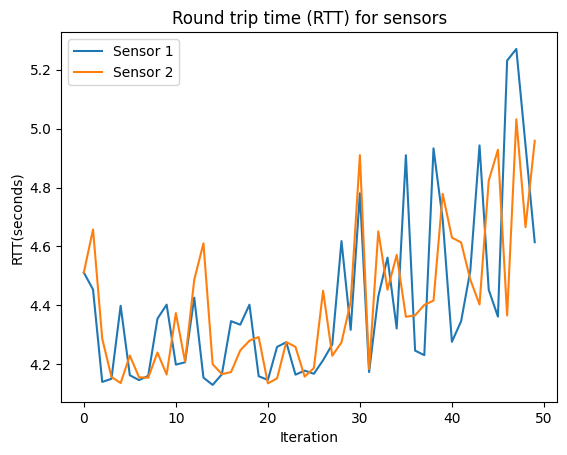

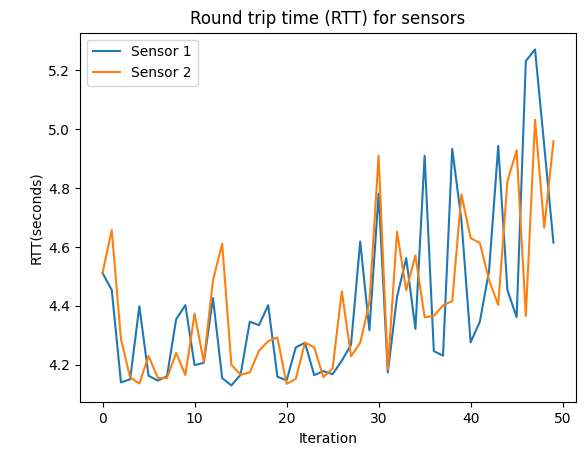

---

Sensor 3 datas:  [29, 27, 27, 25, 30, 29, 28, 24, 22, 28, 26, 23, 22, 24, 25, 24, 21, 20, 22, 26, 30, 25, 24, 27, 28, 22, 20, 26, 25, 27, 29, 28, 29, 24, 20, 27, 26, 22, 24, 29, 23, 26, 22, 27, 23, 29, 30, 23, 27, 23]
Sensor 3 RTT values [4.467902898788452, 4.15290379524231, 4.589576244354248, 4.634145021438599, 4.574157238006592, 4.180563688278198, 4.6346595287323, 4.486841440200806, 4.275710105895996, 4.3480002880096436, 4.150522947311401, 4.205769300460815, 4.1191980838775635, 4.186918497085571, 4.426024436950684, 4.709124326705933, 4.612873554229736, 4.21873140335083, 4.414780139923096, 4.531363487243652, 4.35209059715271, 4.307569980621338, 4.398644208908081, 4.802821159362793, 4.5363945960998535, 4.575747728347778, 5.005313158035278, 4.506454944610596, 4.399336576461792, 4.317206621170044, 4.490001678466797, 4.207066774368286, 4.215004205703735, 4.287757396697998, 4.344430446624756, 4.476930618286133, 4.800098180770874, 4.3316566944122314, 4.859514236450195, 4.242818832397461, 4.

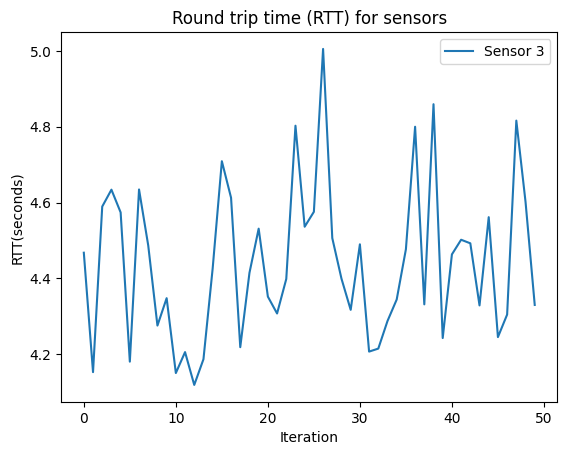

CPU usage [98.4, 93.3, 92.0]
Maximum cpu usage: 98.4 %
Minimum cpu usage: 92.0 %
Mean cpu usage: 94.56666666666666 %
Memory usage [78.9, 79.3, 79.1]
Maximum Memory usage: 79.3 %
Minimum Memory usage: 78.9 %
Mean Memory usage: 79.1 %


In [36]:
#simulate_multiple_sensors(3)
simulate_scenario1(num_sensors=3, iterations=400)